Create a `HOME` constant.

In [56]:
import os
HOME = os.getcwd()
print("HOME:", HOME)

HOME: /Users/samuelstrong/Desktop/Mars_Research/segment-anything/notebooks


In [57]:
import os

# Specify the directory
directory = '../dataset_mrcnn/json'

# Specify the strings to look for in the filenames
required_strings = ['ZCAM07114', 'ZCAM07115']

# Loop through all files in the directory
for filename in os.listdir(directory):
    # Check if neither of the required strings is in the filename
    if not any(required_string in filename for required_string in required_strings):
        # Construct the full file path
        file_path = os.path.join(directory, filename)
        # Check if it is a file (not a directory)
        if os.path.isfile(file_path):
            # Remove the file
            os.remove(file_path)
            print(f'Removed file: {file_path}')


## Upload Image(s)

In [58]:
from PIL import Image
import cv2
import numpy as np

def process_image(image_path):
    # Read the image using OpenCV
    image = cv2.imread(image_path)
    
    # Verify if the image is loaded
    if image is None:
        print(f'Could not open or find the image: {image_path}')
        return None
    
    # Convert the OpenCV image to a PIL Image for easier manipulation
    image_pil = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    image_final = cv2.cvtColor(np.array(image_pil), cv2.COLOR_RGB2BGR)
    
    return image_final

In [59]:
import glob

# Path to the directory with images
imgs_path = '../dataset_mrcnn/img'

# Get a list of all jpeg files in the directory
imgs_files = glob.glob(os.path.join(imgs_path, '*.png'))

# Initialize an empty list to store the images
imgs = []

# Restrict how many
restrict = 0

# Loop over all files
for img_file in imgs_files:
    # Read the image
    img = process_image(img_file)

    # Verify if the image is loaded
    if img is None:
        print(f'Could not open or find the image: {img_file}')
    else:
        # Get the dimensions of the image
        # height, width, channels = img.shape

        imgs.append(img)

print(f"Successfully loaded {len(imgs)} images from {imgs_path}")

Successfully loaded 376 images from ../dataset_mrcnn/img


Make sure we imported right by displaying an image

(-0.5, 1647.5, 1199.5, -0.5)

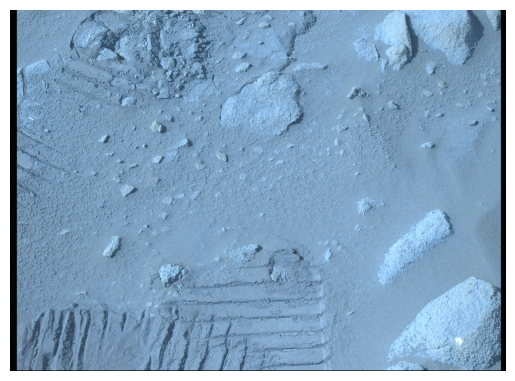

In [60]:
import matplotlib.pyplot as plt
import numpy as np
plt.imshow(imgs[16])
plt.axis('off')  # Hide the axis

### Results visualisation with Supervision

As of version `0.5.0` Supervision has native support for SAM.

In [61]:
image_path = '../dataset_mrcnn/img/ZL0_0385_0701130469_910EBY_N0140000ZCAM07115_1100LMJ02.png'
json_path = '../dataset_mrcnn/json/ZL0_0385_0701130469_910EBY_N0140000ZCAM07115_1100LMJ02.json'

10 34 vs 110 dataset comparison

In [62]:
import os
import random

images_path = '../dataset_mrcnn/img/'

count = 0

image_pairs = [
    
    {'110mm': 'ZL0_0359_0698822899_973EBY_N0100000ZCAM07115_1100LMJ02.png',
    '34mm':'ZL0_0359_0698822996_973EBY_N0100000ZCAM07115_0340LMJ02.png'},
    
    {'34mm': 'ZL0_0380_0700687229_988EBY_N0112472ZCAM07114_0340LMJ02.png',
    '110mm': 'ZL0_0380_0700687330_988EBY_N0112472ZCAM07114_1100LMJ02.png'},
    
    {'34mm': 'ZL0_0382_0700867252_909EBY_N0130000ZCAM07114_0340LMJ02.png',
    '110mm':'ZL0_0382_0700867338_910EBY_N0130000ZCAM07114_1100LMJ02.png'},
    
    {'34mm': 'ZL0_0383_0700954196_723EBY_N0131280ZCAM07114_0340LMJ02.png',
    '110mm':'ZL0_0383_0700954282_723EBY_N0131280ZCAM07114_1100LMJ02.png'},
    
    {'34mm': 'ZL0_0408_0703172074_456EBY_N0212560ZCAM07114_0340LMJ03.png',
    '110mm':'ZL0_0408_0703172169_456EBY_N0212560ZCAM07114_1100LMJ03.png'},
    
    {'110mm': 'ZL0_0648_0724473478_456EBY_N0320000ZCAM07114_1100LMJ02.png',
    '34mm':'ZL0_0648_0724473394_456EBY_N0320000ZCAM07114_0340LMJ02.png'},
    
    {'110mm':'ZL0_0821_0739836703_318EBY_N0400132ZCAM07115_1100LMJ01.png',
    '34mm': 'ZL0_0821_0739836767_318EBY_N0400132ZCAM07115_0340LMJ01.png'},
    
    {'34mm': 'ZL0_0843_0741791134_098EBY_N0410000ZCAM07115_0340LMJ02.png',
    '110mm':'ZL0_0843_0741791001_098EBY_N0410000ZCAM07115_1100LMJ02.png'},
    
    {'34mm': 'ZL0_0926_0749156897_239EBY_N0450760ZCAM07114_0340LMJ01.png',
    '110mm':'ZL0_0926_0749156971_239EBY_N0450760ZCAM07114_1100LMJ02.png'},

    {'34mm':'ZL0_1006_0756258025_456EBY_N0481156ZCAM07114_0340LMJ01.png',
    '110mm':'ZL0_1006_0756258104_456EBY_N0481156ZCAM07114_1100LMJ01.png'},
]
# for filename in selected_images:
#     filename = filename[:-4]
#     image_json_pairs.append((f'../dataset_mrcnn/img/{filename}.png', f'../dataset_mrcnn/json/{filename}.json'))

In [63]:
import json
import math

def analyze_segments(filename):
    # Load JSON data
    filename = filename[:-4]
    json_path = f'../dataset_mrcnn/json/{filename}.json'
    with open(json_path, 'r') as file:
        data = json.load(file)
        
    # FOV angle in degrees for the height
    line_fov_deg = float(data['metadata']['line_fov'])

    # Distance to the floor in mm
    # Figure out focus distance
    # distance_to_floor = float(data['metadata']['focus_distance'])
    distance_to_floor = 2100

    # Image height in pixels
    image_height_pix = 1200

    # Converting the FOV angle from degrees to radians
    line_fov_rad = math.radians(line_fov_deg)

    # Calculating the real-world height of the image
    real_world_height = 2 * math.tan(line_fov_rad / 2) * distance_to_floor

    # Calculating the height of one pixel
    height_per_pixel = real_world_height / image_height_pix


    # Extract information from JSON
    segments = data['segments']

    # Initialize lists for storing extracted details
    long_axes = []
    short_axes = []
    counted_areas = []
    angles = []
    aspect_ratios = []
    count = 0

    # Process each segment
    for segment in segments:
        count += 1
        bbox = segment['bbox']
        polygons = segment['polygon']

        # Process each polygon in the segment
        for polygon in polygons:
            poly_pts = np.array(polygon, np.int32)
            area = 0.5 * np.abs(np.dot(poly_pts[:, 0], np.roll(poly_pts[:, 1], 1)) - np.dot(poly_pts[:, 1], np.roll(poly_pts[:, 0], 1)))
            if len(polygon) >= 5 and area < 1000000:
                poly_pts = np.array(polygon, np.int32).reshape((-1, 1, 2))
                ellipse = cv2.fitEllipse(poly_pts)
                (center_x, center_y), (major_axis, minor_axis), angle = ellipse
                angles.append(angle)
                
                # Calculate the endpoints of the long and short axes
                angle_rad = np.radians(angle)

                short_axes.append(major_axis*height_per_pixel)
                long_axes.append(minor_axis*height_per_pixel)
                counted_areas.append(area*height_per_pixel)
                aspect_ratios.append(major_axis/minor_axis)
                
    return {
        'total_segments': np.mean(count),
        'mean_major_axis (mm)': np.mean(long_axes), 
        'mean_minor_axis (mm)': np.mean(short_axes), 
        'mean_area (mm^2)': np.mean(counted_areas), 
        'mean_angle (deg)': np.mean(angles),
        'mean_aspect_ratio': np.mean(aspect_ratios),
        'median_major_axis (mm)': np.median(long_axes), 
        'median_minor_axis (mm)': np.median(short_axes), 
        'median_area (mm^2)': np.median(counted_areas), 
        'median_angle (deg)': np.median(angles),
        'median_aspect_ratio': np.median(aspect_ratios),
        'height_per_pix': height_per_pixel,
        'file_name': filename,
    }

In [64]:
pairs_results = []
for pair in image_pairs:
    new_entry = {}
    new_entry['34mm'] = analyze_segments(pair['34mm'])
    new_entry['110mm'] = analyze_segments(pair['110mm'])
    new_entry['difference'] = {}
    for (key, value) in new_entry['110mm'].items():
        if (key != 'file_name'):
            new_entry['difference'][key] = np.abs(value - new_entry['34mm'][key])
        else:
            new_entry['difference']['file_name'] = ""
    pairs_results.append(new_entry)

In [65]:
import cv2
import numpy as np
import json
import matplotlib.pyplot as plt
from io import BytesIO

# Function to process and plot an image
def process_and_plot(image_path, json_path, pix_size, focal_length):
    # Load image
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError("Image not found at the specified path.")

    # Convert image to RGB for matplotlib display
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Load JSON data
    with open(json_path, 'r') as file:
        data = json.load(file)

    # Extract segments information
    segments = data['segments']

    # Process each segment
    for segment in segments:
        bbox = segment['bbox']
        polygons = segment['polygon']

        for polygon in polygons:
            poly_pts = np.array(polygon, np.int32)
            area = 0.5 * np.abs(np.dot(poly_pts[:, 0], np.roll(poly_pts[:, 1], 1)) - np.dot(poly_pts[:, 1], np.roll(poly_pts[:, 0], 1)))
            if len(polygon) >= 5 and area < 10000000:
                poly_pts = np.array(polygon, np.int32).reshape((-1, 1, 2))
                ellipse = cv2.fitEllipse(poly_pts)
                (center_x, center_y), (major_axis, minor_axis), angle = ellipse

                angle_rad = np.radians(angle)
                cos_angle = np.cos(angle_rad)
                sin_angle = np.sin(angle_rad)

                half_major_axis = major_axis / 2
                half_minor_axis = minor_axis / 2

                start_long = (int(center_x - cos_angle * half_major_axis), int(center_y - sin_angle * half_major_axis))
                end_long = (int(center_x + cos_angle * half_major_axis), int(center_y + sin_angle * half_major_axis))

                start_short = (int(center_x + sin_angle * half_minor_axis), int(center_y - cos_angle * half_minor_axis))
                end_short = (int(center_x - sin_angle * half_minor_axis), int(center_y + cos_angle * half_minor_axis))

                # Draw the axes on the image
                cv2.line(img_rgb, start_long, end_long, (0, 0, 255), 2)
                cv2.line(img_rgb, start_short, end_short, (255, 0, 0), 2)
                cv2.polylines(img_rgb, [poly_pts], True, (0, 255, 0), 2)

    if (focal_length == 110):
        # Add a scale bar
        bar_length_mm = 25  # length of the scale bar in mm
        bar_length_px = int(bar_length_mm / pix_size)  # convert length to pixels

        # Coordinates for the scale bar
        bar_height = 10  # height of the scale bar in pixels
        bar_color = (255, 255, 0)  # yellow color for the scale bar

        # Bottom right corner of the image
        img_height, img_width, _ = img_rgb.shape
        start_x = img_width - bar_length_px - 20  # 20 pixels from the right edge
        start_y = img_height - bar_height - 20  # 20 pixels from the bottom edge
        end_x = img_width - 20  # end x-coordinate for the bar
        end_y = img_height - 20  # end y-coordinate for the bar

        # Draw the scale bar
        cv2.rectangle(img_rgb, (start_x, start_y), (end_x, end_y), bar_color, -1)
    else:
        # Add a scale bar
        bar_length_mm = 100  # length of the scale bar in mm
        bar_length_px = int(bar_length_mm / pix_size)  # convert length to pixels

        # Coordinates for the scale bar
        bar_height = 10  # height of the scale bar in pixels
        bar_color = (255, 255, 0)  # yellow color for the scale bar

        # Bottom right corner of the image
        img_height, img_width, _ = img_rgb.shape
        start_x = img_width - bar_length_px - 20  # 20 pixels from the right edge
        start_y = img_height - bar_height - 20  # 20 pixels from the bottom edge
        end_x = img_width - 20  # end x-coordinate for the bar
        end_y = img_height - 20  # end y-coordinate for the bar

        # Draw the scale bar
        cv2.rectangle(img_rgb, (start_x, start_y), (end_x, end_y), bar_color, -1)


    # Return the processed image
    return img_rgb


In [66]:
import textwrap
# Function to wrap text
def wrap_text(text, width):
    return '\n'.join(textwrap.wrap(text, width))



def render_side_by_side(img_rgb1, img_rgb2, title1, title2):
    # Create subplots with 1 row and 2 columns
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # Display the first image
    axs[0].imshow(img_rgb1)
    axs[0].set_title("34.0mm Focal Length", fontsize=16, fontweight='bold')  # Main title
    axs[0].text(0.5, -0.15, title1, ha='center', fontsize=12, transform=axs[0].transAxes)
    axs[0].text(0.9, 0.06, "100mm", ha='center', color='yellow', fontsize=12, transform=axs[0].transAxes)
    axs[0].axis('off')  # Turn off the axis

    # Display the second image
    axs[1].imshow(img_rgb2)
    axs[1].set_title("110.0mm Focal Length", fontsize=16, fontweight='bold')  # Main title
    axs[1].text(0.5, -0.15, title2, ha='center', fontsize=12, transform=axs[1].transAxes)
    axs[1].text(0.9, 0.06, "25mm", ha='center', color='yellow', fontsize=12, transform=axs[1].transAxes)
    axs[1].axis('off')  # Turn off the axis
    
    
    # Adjust layout to avoid overlap
    plt.tight_layout()
    
    # Save the image to an in-memory buffer
    buffer = BytesIO()
    plt.savefig(buffer, format='png')
    plt.close(fig)
    buffer.seek(0)
    img_str = base64.b64encode(buffer.read()).decode('utf-8')
    img_html = f'<img src="data:image/png;base64,{img_str}" style="max-width: 100%;">'
    
    return img_html

RESULT FROM SOL: 0359


,34mm,110mm,difference
total_segments,189.0,284.0,95.0
mean_major_axis (mm),53.35059,6.815721,46.534869
mean_minor_axis (mm),38.078267,4.686911,33.391356
mean_area (mm^2),5472.760314,133.81535,5338.944964
mean_angle (deg),84.340674,99.302782,14.962109
mean_aspect_ratio,0.729104,0.729171,0.000067
median_major_axis (mm),15.056945,6.728032,8.328913
median_minor_axis (mm),11.550929,4.10547,7.445459
median_area (mm^2),187.578288,113.714623,73.863665
median_angle (deg),83.690338,96.83889,13.148552

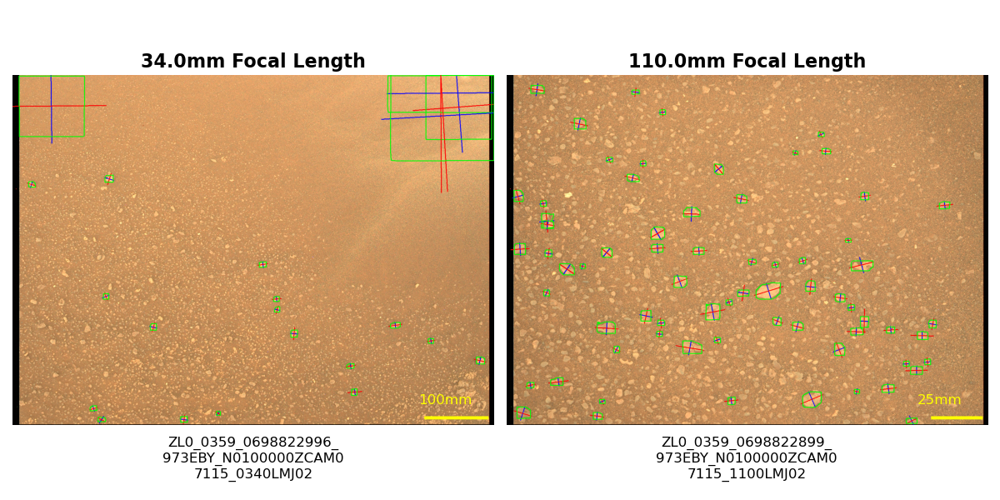




RESULT FROM SOL: 0380


,34mm,110mm,difference
total_segments,284.0,192.0,92.0
mean_major_axis (mm),18.576134,9.589103,8.987032
mean_minor_axis (mm),13.021973,6.283014,6.738959
mean_area (mm^2),319.950729,281.9807,37.970029
mean_angle (deg),98.741229,84.259683,14.481547
mean_aspect_ratio,0.73937,0.683973,0.055397
median_major_axis (mm),15.762235,8.318265,7.44397
median_minor_axis (mm),11.99019,5.687016,6.303174
median_area (mm^2),222.479218,178.962459,43.516759
median_angle (deg),98.326229,92.951981,5.374249

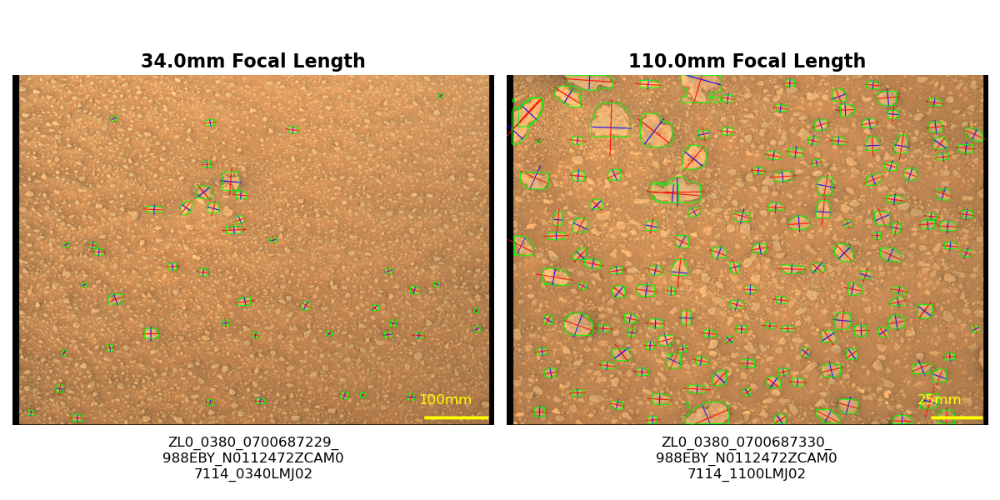




RESULT FROM SOL: 0382


,34mm,110mm,difference
total_segments,212.0,288.0,76.0
mean_major_axis (mm),23.852828,7.691054,16.161773
mean_minor_axis (mm),14.957365,5.089046,9.868318
mean_area (mm^2),598.916233,162.524343,436.39189
mean_angle (deg),89.939606,96.915212,6.975606
mean_aspect_ratio,0.693693,0.692123,0.00157
median_major_axis (mm),18.768623,7.179702,11.588921
median_minor_axis (mm),13.168759,4.432878,8.735881
median_area (mm^2),267.384323,116.405255,150.979068
median_angle (deg),93.569801,93.429638,0.140163

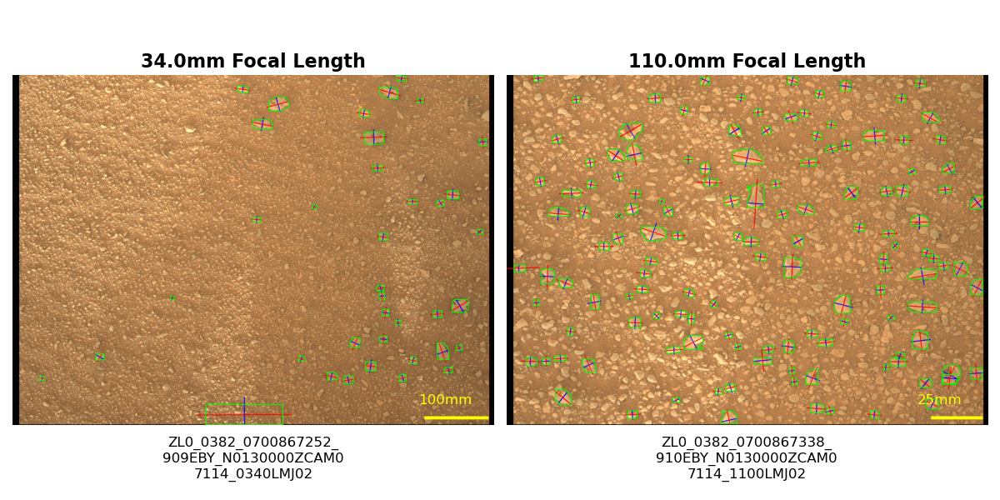




RESULT FROM SOL: 0383


,34mm,110mm,difference
total_segments,281.0,147.0,134.0
mean_major_axis (mm),18.655282,10.763485,7.891796
mean_minor_axis (mm),12.898029,7.167333,5.730696
mean_area (mm^2),305.503137,366.464838,60.961701
mean_angle (deg),88.355651,92.528086,4.172435
mean_aspect_ratio,0.729634,0.687908,0.041725
median_major_axis (mm),16.387293,9.783973,6.60332
median_minor_axis (mm),12.336642,6.862935,5.473707
median_area (mm^2),239.418106,287.472832,48.054726
median_angle (deg),87.222019,91.07756,3.855541

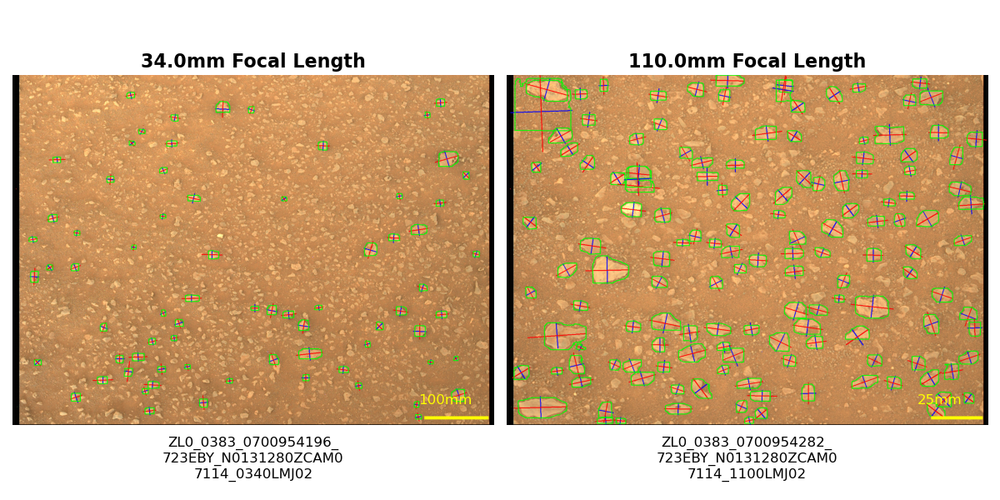




RESULT FROM SOL: 0408


,34mm,110mm,difference
total_segments,244.0,152.0,92.0
mean_major_axis (mm),27.344224,11.301534,16.04269
mean_minor_axis (mm),17.990416,7.677517,10.3129
mean_area (mm^2),706.214661,422.441721,283.77294
mean_angle (deg),67.892015,80.383368,12.491352
mean_aspect_ratio,0.688125,0.703647,0.015522
median_major_axis (mm),23.060885,10.582927,12.477958
median_minor_axis (mm),15.871721,7.621856,8.249866
median_area (mm^2),398.348074,306.165647,92.182427
median_angle (deg),80.668037,82.665329,1.997292

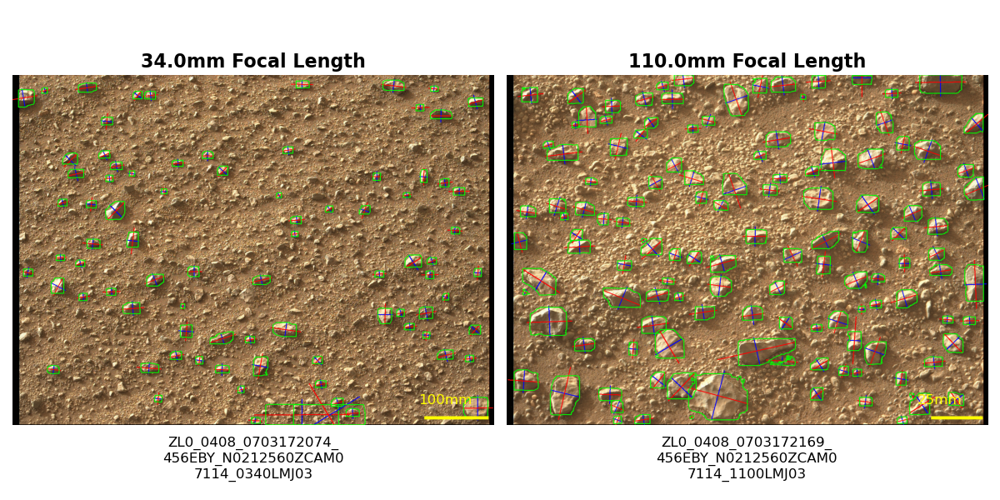




RESULT FROM SOL: 0648


,34mm,110mm,difference
total_segments,242.0,197.0,45.0
mean_major_axis (mm),29.555156,12.09316,17.461995
mean_minor_axis (mm),18.556443,7.574719,10.981725
mean_area (mm^2),859.751221,431.356563,428.394658
mean_angle (deg),108.858004,102.583305,6.274699
mean_aspect_ratio,0.661668,0.660678,0.00099
median_major_axis (mm),24.38061,10.293761,14.086849
median_minor_axis (mm),14.077371,6.907412,7.169959
median_area (mm^2),389.253369,276.214659,113.038709
median_angle (deg),96.771362,97.742096,0.970734

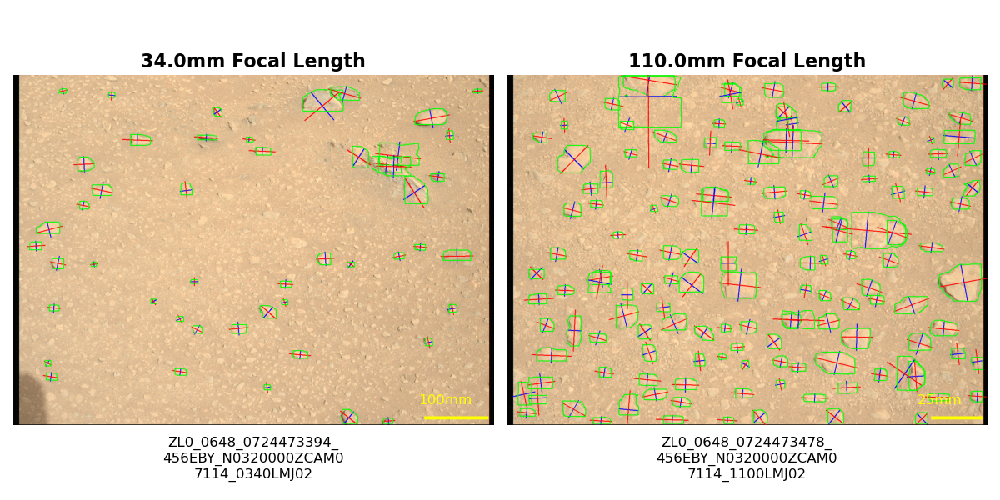




RESULT FROM SOL: 0821


,34mm,110mm,difference
total_segments,211.0,232.0,21.0
mean_major_axis (mm),75.210702,15.611873,59.59883
mean_minor_axis (mm),39.522082,10.252339,29.269743
mean_area (mm^2),4571.580465,1043.86979,3527.710676
mean_angle (deg),82.384918,94.97095,12.586032
mean_aspect_ratio,0.71267,0.688954,0.023717
median_major_axis (mm),27.734634,8.310848,19.423786
median_minor_axis (mm),21.692002,5.773442,15.918559
median_area (mm^2),735.306889,171.279995,564.026894
median_angle (deg),82.362827,92.304432,9.941605

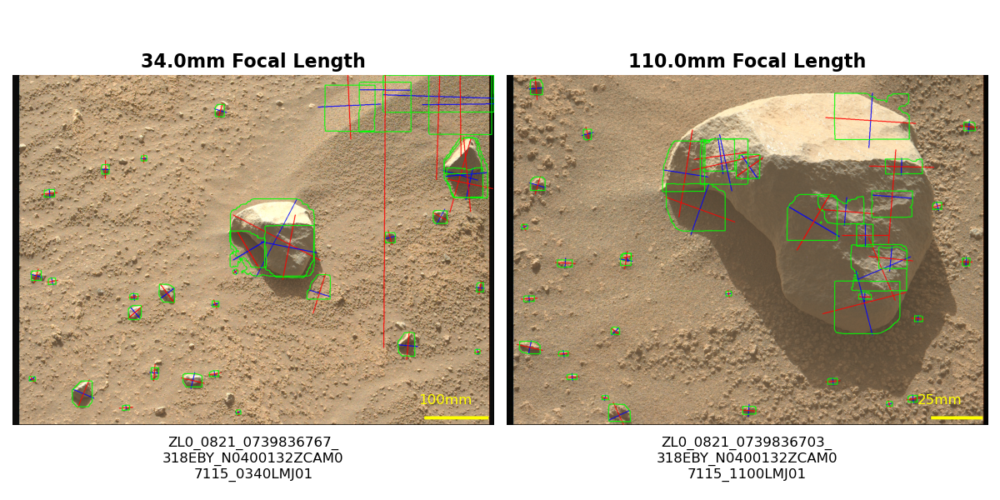




RESULT FROM SOL: 0843


,34mm,110mm,difference
total_segments,218.0,210.0,8.0
mean_major_axis (mm),42.688014,15.398262,27.289752
mean_minor_axis (mm),24.278608,9.253832,15.024776
mean_area (mm^2),1675.94141,766.394439,909.546972
mean_angle (deg),106.629995,96.612523,10.017472
mean_aspect_ratio,0.651403,0.643195,0.008208
median_major_axis (mm),32.659241,12.435241,20.224
median_minor_axis (mm),21.318598,8.100504,13.218095
median_area (mm^2),857.63067,393.25717,464.3735
median_angle (deg),99.478123,95.320145,4.157978

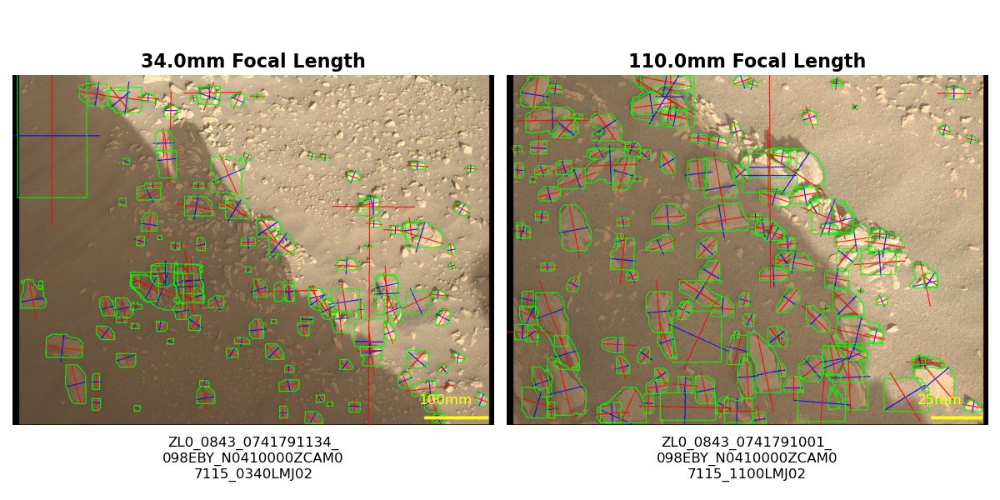




RESULT FROM SOL: 0926


,34mm,110mm,difference
total_segments,254.0,167.0,87.0
mean_major_axis (mm),32.145547,19.017066,13.128481
mean_minor_axis (mm),20.719641,10.130604,10.589037
mean_area (mm^2),1626.600599,995.667177,630.933422
mean_angle (deg),76.733267,78.059063,1.325796
mean_aspect_ratio,0.679021,0.677996,0.001026
median_major_axis (mm),22.625477,10.849652,11.775826
median_minor_axis (mm),13.683306,7.807114,5.876192
median_area (mm^2),346.508256,346.100296,0.40796
median_angle (deg),83.248562,84.424297,1.175735

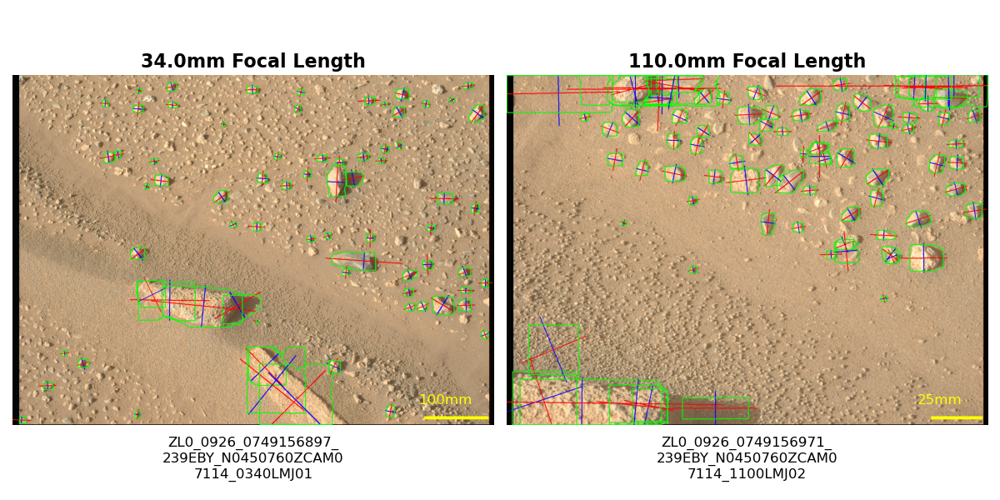




RESULT FROM SOL: 1006


,34mm,110mm,difference
total_segments,205.0,264.0,59.0
mean_major_axis (mm),60.847221,24.496793,36.350427
mean_minor_axis (mm),38.555359,16.815027,21.740331
mean_area (mm^2),4513.49317,2085.755996,2427.737174
mean_angle (deg),73.212677,70.365265,2.847412
mean_aspect_ratio,0.665055,0.723456,0.058402
median_major_axis (mm),44.111152,21.904802,22.206351
median_minor_axis (mm),30.211395,15.801894,14.409501
median_area (mm^2),1739.589675,1297.592886,441.996789
median_angle (deg),80.007484,82.121742,2.114258

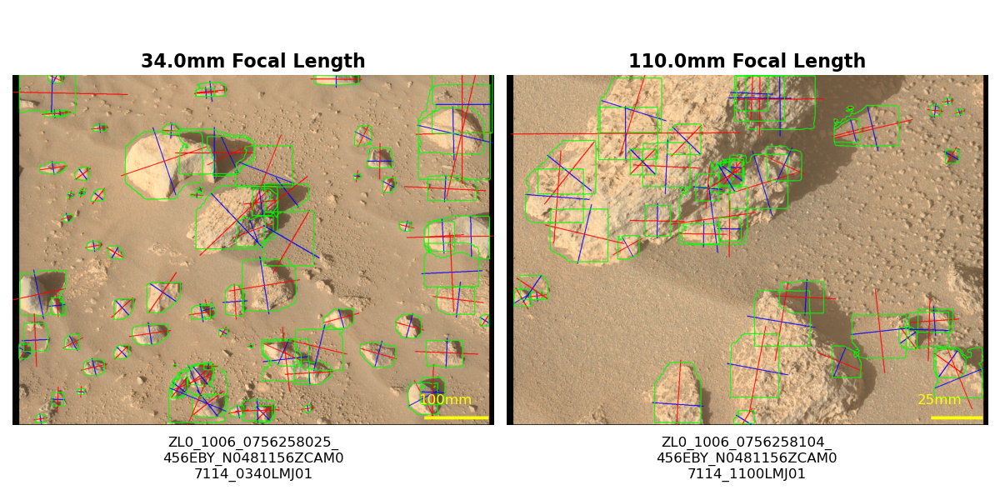

In [67]:
import pandas as pd
from IPython.display import display, HTML
import copy
import base64

for result in pairs_results:
    print("RESULT FROM SOL: " + result['110mm']['file_name'][4:8])
    result_copy = result.copy()
    df = pd.DataFrame(result_copy)
    
    # Generate the image paths
    image_path1 = f"../dataset_mrcnn/img/{df['34mm']['file_name']}.png"
    json_path1 = f"../dataset_mrcnn/json/{df['34mm']['file_name']}.json"
    image_path2 = f"../dataset_mrcnn/img/{df['110mm']['file_name']}.png"
    json_path2 = f"../dataset_mrcnn/json/{df['110mm']['file_name']}.json"

    df.loc['file_name'] = df.loc['file_name'].apply(lambda x: wrap_text(x, 20))
    
    # Process the image
    img_rgb1 = process_and_plot(image_path1, json_path1, result['34mm']['height_per_pix'], 34)
    img_rgb2 = process_and_plot(image_path2, json_path2, result['110mm']['height_per_pix'], 110)
    
    img_html = render_side_by_side(img_rgb1, img_rgb2, df['34mm']['file_name'], df['110mm']['file_name'])
    
    new_df = copy.deepcopy(df)
    new_df = new_df.drop(index='file_name')
    new_df = new_df.drop(index='height_per_pix')
    df_html = new_df.to_html(escape=False)
    # Create the combined display of the DataFrame and the image
    html = f"""
    <div style="display: flex; align-items: flex-start;">
        <div style="flex: 1; display: flex; align-items: center; justify-content: center; width: 20%; height: 347px; overflow: auto; border: 2px solid black; background: #aaa">
        <div style="margin:auto; background: #333;">
            {df_html}
        </div>
        </div>
        <div style="flex: 1; width: 80%">
            {img_html}
        </div>
    </div>
    """
    
    display(HTML(html))
    print("\n\n")

In [68]:
import glob

# Path to the directory with images
imgs_path = '../dataset_mrcnn/img'

# Get a list of all jpeg files in the directory
imgs_files = glob.glob(os.path.join(imgs_path, '*.png'))

# Initialize an empty list to store the images
all_results = {}

# Restrict how many
restrict = 0

# Loop over all files
for img_file in imgs_files:
    # Read the image
    filename = img_file[21:]
    sol = filename[4:8]
    all_results[sol] = analyze_segments(filename)

In [69]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# Convert all_results to a DataFrame
all_results_df = pd.DataFrame.from_dict(all_results, orient='index')

# Convert SOL to integers
all_results_df.index = all_results_df.index.astype(int)
all_results_df = all_results_df.drop('height_per_pix', axis=1)
all_results_df = all_results_df.drop('file_name', axis=1)
columns_to_drop = [col for col in all_results_df.columns if 'median' in col]
all_results_df = all_results_df.drop(columns=columns_to_drop)

In [70]:
# Fill in missing SOLs (time axis)
all_sols = np.arange(all_results_df.index.min(), all_results_df.index.max() + 1)
all_results_df = all_results_df.reindex(all_sols).interpolate(method='linear')

# Ensure no NaN values remain by filling any remaining NaNs
all_results_df = all_results_df.fillna(method='ffill').fillna(method='bfill')

# Robust Scaling (IQR normalization)
Q1 = all_results_df.quantile(0.1)
Q3 = all_results_df.quantile(0.9)
IQR = Q3 - Q1

normalized_df = (all_results_df - Q1) / IQR

# Clip values to ensure they are within a range (e.g., 0 to 1)
normalized_df = normalized_df.clip(lower=0, upper=1)

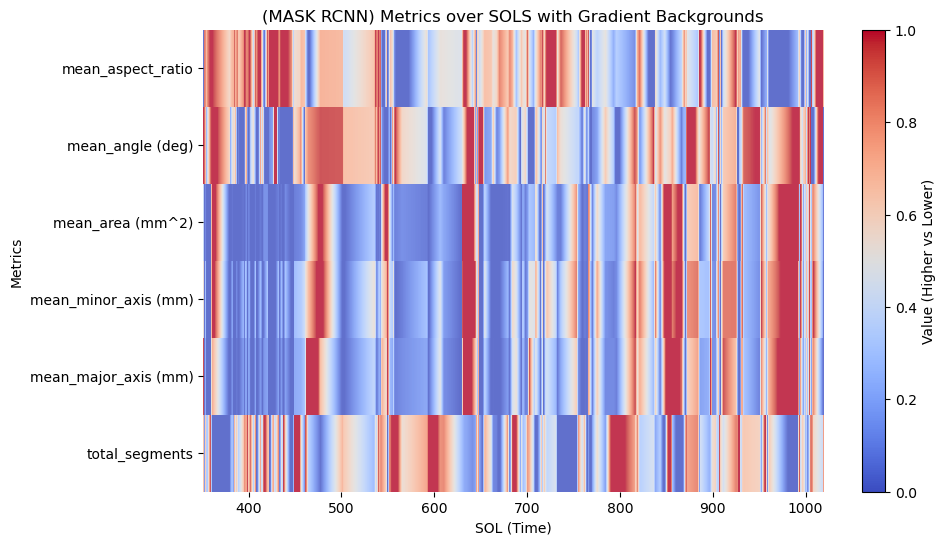

In [75]:

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Define the y-axis ranges for each metric
num_metrics = len(normalized_df.columns)
y_ranges = [(i, i + 1) for i in range(num_metrics)]

# Plot the gradient backgrounds for each metric
cmap = 'coolwarm'
for metric, y_range in zip(normalized_df.columns, y_ranges):
    y = normalized_df[metric]
    gradient = np.vstack((y, y))
    extent = [normalized_df.index.min(), normalized_df.index.max(), y_range[0], y_range[1]]
    ax.imshow(gradient, aspect='auto', cmap=cmap, extent=extent, alpha=0.8)

# Set labels and title
ax.set_xlabel('SOL (Time)')
ax.set_ylabel('Metrics')
ax.set_title('(MASK RCNN) Metrics over SOLS with Gradient Backgrounds')
ax.set_yticks([i + 0.5 for i in range(num_metrics)])
ax.set_yticklabels(normalized_df.columns)

# Remove the x and y axis spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Adjust the limits to ensure the last gradient is fully visible
ax.set_ylim(0, num_metrics)

cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmap), ax=ax, orientation='vertical')
cbar.set_label('Value (Higher vs Lower)')

# Show the plot
plt.show()

In [72]:
# Convert all_results to a DataFrame
all_results_df = pd.DataFrame.from_dict(all_results, orient='index')

# Convert SOL to integers
all_results_df.index = all_results_df.index.astype(int)
all_results_df = all_results_df.drop('height_per_pix', axis=1)
all_results_df = all_results_df.drop('file_name', axis=1)
columns_to_drop = [col for col in all_results_df.columns if 'median' in col]
all_results_df = all_results_df.drop(columns=columns_to_drop)

In [76]:
import json
import math

def store_pure_results(filename):
    # Load JSON data
    filename = filename[:-4]
    json_path = f'../dataset_mrcnn/json/{filename}.json'
    with open(json_path, 'r') as file:
        data = json.load(file)
        
    # FOV angle in degrees for the height
    line_fov_deg = float(data['metadata']['line_fov'])

    # Distance to the floor in mm
    distance_to_floor = float(data['metadata']['focus_distance'])

    # Image height in pixels
    image_height_pix = 1200

    # Converting the FOV angle from degrees to radians
    line_fov_rad = math.radians(line_fov_deg)

    # Calculating the real-world height of the image
    real_world_height = 2 * math.tan(line_fov_rad / 2) * distance_to_floor

    # Calculating the height of one pixel
    height_per_pixel = real_world_height / image_height_pix


    # Extract information from JSON
    segments = data['segments']

    # Initialize lists for storing extracted details
    long_axes = []
    short_axes = []
    counted_areas = []
    angles = []
    aspect_ratios = []
    count = 0

    # Process each segment
    for segment in segments:
        count += 1
        bbox = segment['bbox']
        polygons = segment['polygon']

        # Process each polygon in the segment
        for polygon in polygons:
            poly_pts = np.array(polygon, np.int32)
            area = 0.5 * np.abs(np.dot(poly_pts[:, 0], np.roll(poly_pts[:, 1], 1)) - np.dot(poly_pts[:, 1], np.roll(poly_pts[:, 0], 1)))
            if len(polygon) >= 5 and area < 1000000:
                poly_pts = np.array(polygon, np.int32).reshape((-1, 1, 2))
                ellipse = cv2.fitEllipse(poly_pts)
                (center_x, center_y), (major_axis, minor_axis), angle = ellipse
                angles.append(angle)
                
                # Calculate the endpoints of the long and short axes
                angle_rad = np.radians(angle)

                short_axes.append(major_axis*height_per_pixel)
                long_axes.append(minor_axis*height_per_pixel)
                counted_areas.append(area*height_per_pixel)
                aspect_ratios.append(major_axis/minor_axis)
                
    return {
        'count': count,
        'major_axes': long_axes, 
        'minor_axes': short_axes, 
        'areas': counted_areas, 
        'angles': angles,
        'aspect_ratios': aspect_ratios,
    }

In [77]:
pairs_results = {'110mm': [], '34mm': []}
for pair in image_pairs:
    res_110 = store_pure_results(pair['110mm'])
    res_34 = store_pure_results(pair['34mm'])
    pairs_results['110mm'].append(res_110)
    pairs_results['34mm'].append(res_34)

In [78]:
# Function to calculate averages of a list of dictionaries
def calculate_averages(results):
    if not results:
        return {}
    averages = {}
    num_entries = len(results)
    keys = results[0].keys()
    
    for key in keys:
        values = [d[key] for d in results]
        if isinstance(values[0], list):
            flattened_values = [item for sublist in values for item in sublist]
            averages[key] = sum(flattened_values) / len(flattened_values)
        else:
            averages[key] = sum(values) / num_entries
        
    return averages

# Function to calculate medians of a list of dictionaries
def calculate_medians(results):
    if not results:
        return {}
    medians = {}
    keys = results[0].keys()
    
    for key in keys:
        values = [d[key] for d in results]
        if isinstance(values[0], list):
            flattened_values = [item for sublist in values for item in sublist]
            medians[key] = np.median(flattened_values)
        else:
            medians[key] = np.median(values)
        
    return medians

In [79]:
# Calculate averages and medians
averages_110mm = calculate_averages(pairs_results['110mm'])
medians_110mm = calculate_medians(pairs_results['110mm'])
averages_34mm = calculate_averages(pairs_results['34mm'])
medians_34mm = calculate_medians(pairs_results['34mm'])

# Create DataFrames for averages and medians
averages_df = pd.DataFrame({
    'Metric': averages_110mm.keys(),
    '110mm': averages_110mm.values(),
    '34mm': averages_34mm.values()
}).set_index('Metric')

medians_df = pd.DataFrame({
    'Metric': medians_110mm.keys(),
    '110mm': medians_110mm.values(),
    '34mm': medians_34mm.values()
}).set_index('Metric')

# Combine averages and medians into one DataFrame
combined_df = pd.concat([averages_df.add_suffix('_avg'), medians_df.add_suffix('_med')], axis=1)

combined_df

,110mm_avg,34mm_avg,110mm_med,34mm_med
Metric,,,,
count,213.300000,234.000000,203.500000,230.000000
major_axes,12.289352,1.478300,9.545577,0.521708
minor_axes,7.812204,0.884846,6.642649,0.340049
areas,535.815344,81.799287,248.281647,7.738295
angles,90.838980,87.817614,92.089684,88.072762
aspect_ratios,0.683233,0.686149,0.705726,0.703790


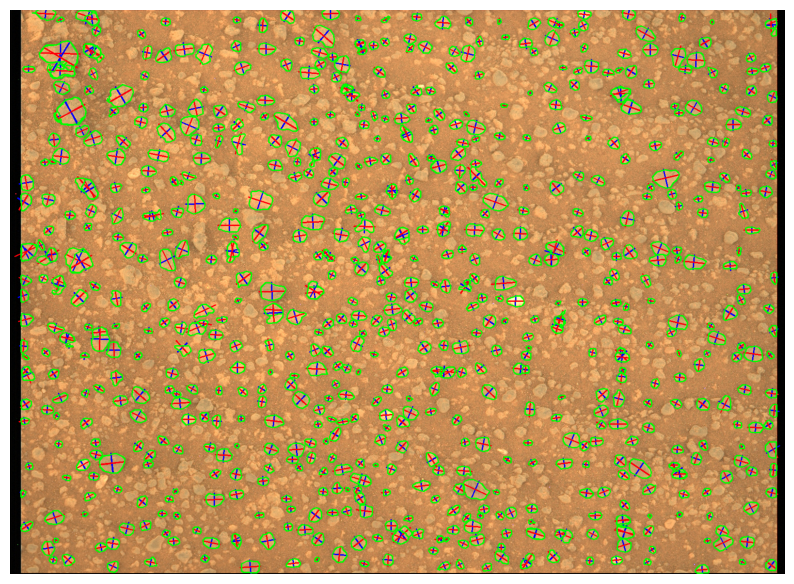

In [ ]:
import json
# Load the image
img = cv2.imread(image_path)
if img is None:
    raise FileNotFoundError("Image not found at the specified path.")

# Convert image to RGB for matplotlib display
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Load JSON data
with open(json_path, 'r') as file:
    data = json.load(file)

# Extract information from JSON
segments = data['segments']

# Initialize lists for storing extracted details
long_axes = []
short_axes = []
counted_areas = []
angles = []

# Process each segment
for segment in segments:
    bbox = segment['bbox']
    polygons = segment['polygon']
    area = segment['area']

    # Process each polygon in the segment
    for polygon in polygons:
        if len(polygon) >= 5 and area < 1000000:
            poly_pts = np.array(polygon, np.int32).reshape((-1, 1, 2))
            ellipse = cv2.fitEllipse(poly_pts)
            (center_x, center_y), (major_axis, minor_axis), angle = ellipse
            
            # Calculate the endpoints of the long and short axes
            angle_rad = np.radians(angle)
            cos_angle = np.cos(angle_rad)
            sin_angle = np.sin(angle_rad)
            
            half_major_axis = major_axis / 2
            half_minor_axis = minor_axis / 2
            short_axes.append(half_major_axis)
            long_axes.append(half_minor_axis)
            counted_areas.append(area)
            
            start_long = (int(center_x - cos_angle * half_major_axis), int(center_y - sin_angle * half_major_axis))
            end_long = (int(center_x + cos_angle * half_major_axis), int(center_y + sin_angle * half_major_axis))
            
            start_short = (int(center_x + sin_angle * half_minor_axis), int(center_y - cos_angle * half_minor_axis))
            end_short = (int(center_x - sin_angle * half_minor_axis), int(center_y + cos_angle * half_minor_axis))
            
            # Draw the axes on the image with a smaller line width
            cv2.line(img_rgb, start_long, end_long, (0, 0, 255), 2)  # Red for long axis
            cv2.line(img_rgb, start_short, end_short, (255, 0, 9), 2)  # Blue for short axis
            
            # Draw the polygon in green:
            cv2.polylines(img_rgb, [poly_pts], True, (0, 255, 0), 2)

# Show the image with overlays
plt.figure(figsize=(10, 10))
plt.imshow(img_rgb)
plt.axis('off')
plt.show()

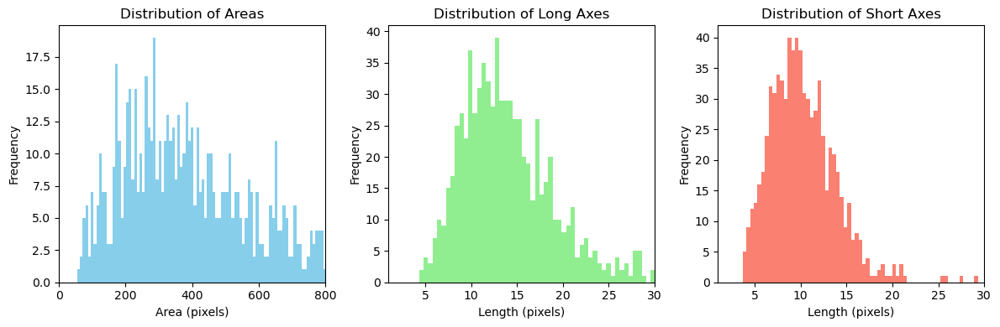

In [ ]:
# Assuming you have collected 'areas', 'long_axes', and 'short_axes' data for all segments across images
# For demonstration, let's create some sample data

import numpy as np
import matplotlib.pyplot as plt

# Plotting the distribution of areas
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.hist(counted_areas, bins=500, color='skyblue')
plt.title('Distribution of Areas')
plt.xlabel('Area (pixels)')
plt.ylabel('Frequency')
plt.xlim(0, 800)

# Plotting the distribution of long axes
plt.subplot(1, 3, 2)
plt.hist(long_axes, bins=80, color='lightgreen')
plt.title('Distribution of Long Axes')
plt.xlabel('Length (pixels)')
plt.ylabel('Frequency')
plt.xlim(1, 30)

# Plotting the distribution of short axes
plt.subplot(1, 3, 3)
plt.hist(short_axes, bins=80, color='salmon')
plt.title('Distribution of Short Axes')
plt.xlabel('Length (pixels)')
plt.ylabel('Frequency')
plt.xlim(1, 30)

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# Create a DataFrame from the series
data = pd.DataFrame({'Areas': counted_areas, 'Long Axes': long_axes, 'Short Axes': short_axes})

# Print summary statistics for all three
print(data.describe())


             Areas   Long Axes  Short Axes
count   749.000000  749.000000  749.000000
mean    486.575434   14.029183   10.250743
std     391.545278    5.177385    3.647271
min      55.000000    4.347765    3.683035
25%     257.000000   10.245184    7.666304
50%     389.000000   13.105140    9.767472
75%     607.000000   16.881617   12.231211
max    4117.000000   43.138645   36.255306
